<a href="https://colab.research.google.com/github/romerik/Geospatial_Data_Analysis_Python/blob/main/OpenStreetMap_OSMnx.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Chapter 5. OpenStreetMap: Accessing Geospatial Data with OSMnx

In [3]:
!pip install osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.4/101.4 kB 3.0 MB/s eta 0:00:00


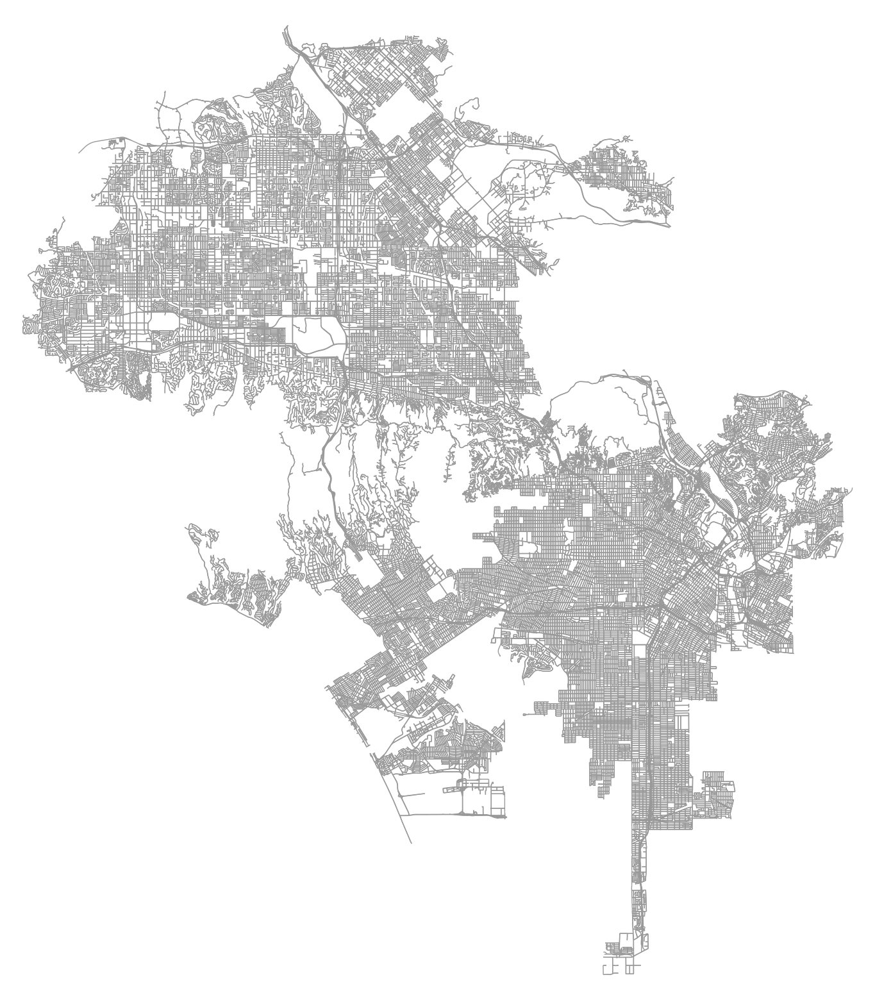

In [4]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt #installs with osmnx

# download/model a street network for some city then visualize it
G = ox.graph_from_place("Los Angeles,California,United States",
network_type="drive")
fig, ax = ox.plot_graph(G,figsize=(20,20),bgcolor='#FFFFFF',
    node_color='black', node_size=0)

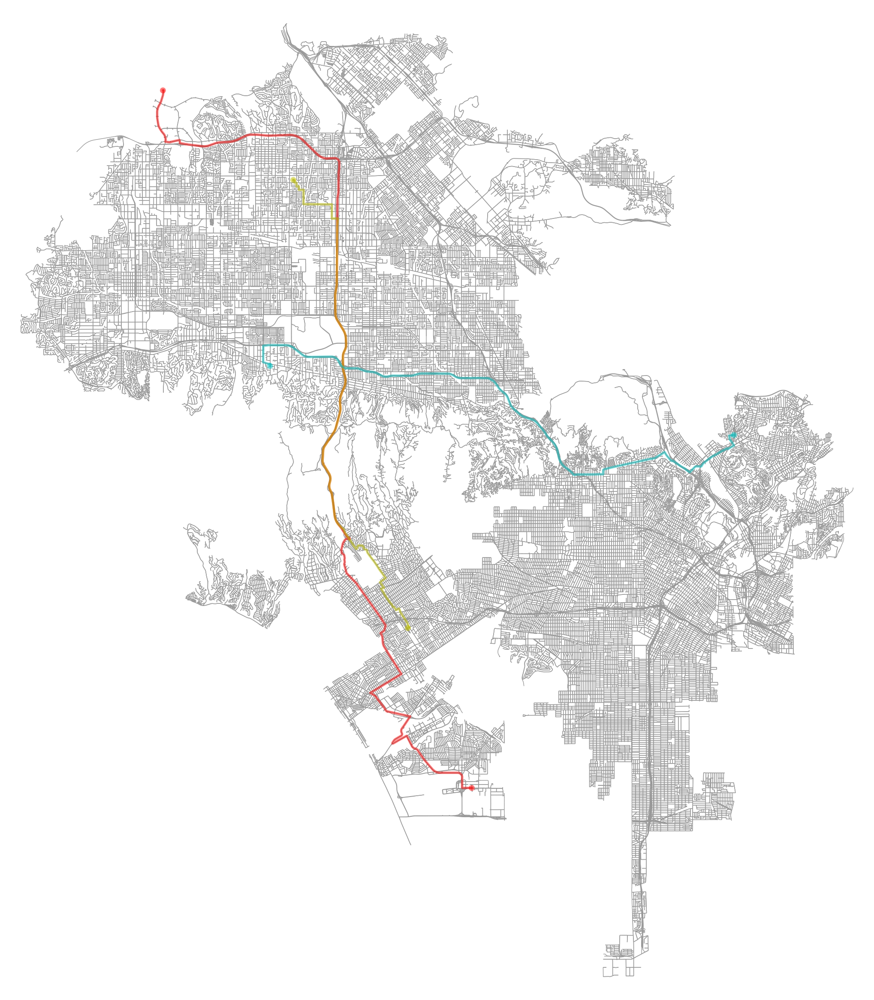

In [5]:
G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)

w = 'travel_time'
orig, dest = list(G)[10], list(G)[-10]
route1 = nx.shortest_path(G, orig, dest, weight=w)
orig, dest = list(G)[0], list(G)[-1]
route2 = nx.shortest_path(G, orig, dest, weight=w)
orig, dest = list(G)[-100], list(G)[100]
route3 = nx.shortest_path(G, orig, dest, weight=w)

routes = [route1, route2, route3]
rc = ['r', 'y', 'c']
fig, ax = ox.plot_graph_routes(G, routes, route_colors=rc, route_linewidth=6,
figsize=(30, 30),node_size=0,bgcolor='#FFFFFF')

/usr/local/lib/python3.10/dist-packages/osmnx/graph.py:367: UserWarning: The clean_periphery argument has been deprecated and will be removed in a future release. Future behavior will be as though clean_periphery=True.
  G = graph_from_polygon(
/usr/local/lib/python3.10/dist-packages/osmnx/graph.py:367: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(


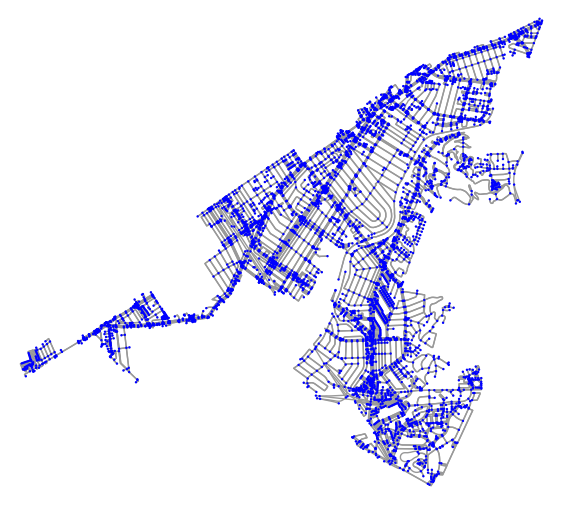

In [6]:
place_name = 'Culver City, California, United States'
G = ox.graph_from_place(place_name, clean_periphery=False,
network_type="all_private")
fig, ax = ox.plot_graph(G,figsize=(7,7),bgcolor='#FFFFFF',
     node_color="b",node_size=3)

In [7]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt #installs with osmnx
import pandas as pd
%matplotlib inline
ox.__version__

'1.6.0'

In [9]:
# get the network for Manhattan, calculate its basic stats and show the average  circuity
stats = ox.basic_stats(ox.graph_from_place("Manhattan,New York,United States"))
stats["circuity_avg"]

1.0295918849601753

In [10]:
# get the network for Staten Island, calculate its basic stats and show the average circuity
stats = ox.basic_stats(ox.graph_from_place("Staten Island,New York,United States"))
stats["circuity_avg"]

1.0710366893812535

In [11]:
stats = ox.basic_stats(ox.graph_from_place("Paris, France"))
stats["circuity_avg"]

1.031811827937779

In [12]:
# get street network, and area in square meters
place = "Paris, France"
gdf = ox.geocode_to_gdf(place)
area = ox.project_gdf(gdf).unary_union.area
G = ox.graph_from_place(place, network_type="drive")

In [13]:
# calculate basic stats, merge them, and display
stats = ox.basic_stats(G, area=area)
pd.Series(stats)

n                                                                            9600
m                                                                           18536
k_avg                                                                    3.861667
edge_length_total                                                       1806817.4
edge_length_avg                                                         97.476122
streets_per_node_avg                                                     3.157812
streets_per_node_counts         {0: 0, 1: 517, 2: 153, 3: 6438, 4: 2302, 5: 17...
streets_per_node_proportions    {0: 0.0, 1: 0.05385416666666667, 2: 0.0159375,...
intersection_count                                                           9083
street_length_total                                                   1487726.755
street_segment_count                                                        15051
street_length_avg                                                       98.845708
circuity_avg    

In [14]:
# unpack dicts into individual keys:values
stats = ox.basic_stats(G, area=area)
for k, count in stats["streets_per_node_counts"].items():
    stats["{}way_int_count".format(k)] = count
for k, proportion in stats["streets_per_node_proportions"].items():
    stats["{}way_int_prop".format(k)] = proportion
# delete the no longer needed dict elements
del stats["streets_per_node_counts"]
del stats["streets_per_node_proportions"]

# load as a pandas dataframe
pd.DataFrame(pd.Series(stats, name="value")).round(3)

,value
n,9600.000
m,18536.000
k_avg,3.862
edge_length_total,1806817.400
edge_length_avg,97.476
streets_per_node_avg,3.158
intersection_count,9083.000
street_length_total,1487726.755
street_segment_count,15051.000
street_length_avg,98.846


In [15]:
# calculate betweenness with a digraph of G (ie, no parallel edges)
bc = nx.betweenness_centrality(ox.get_digraph(G), weight="length")
max_node, max_bc = max(bc.items(), key=lambda x: x[1])
max_node, max_bc

(332476877, 0.11869522770363944)

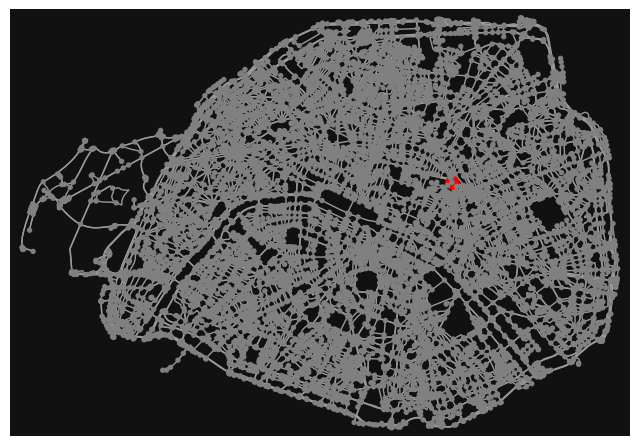

In [16]:
nc = ["r" if node == max_node else "grey" for node in G.nodes]
ns = [100 if node == max_node else 15 for node in G.nodes]
fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=5)
plt.show()

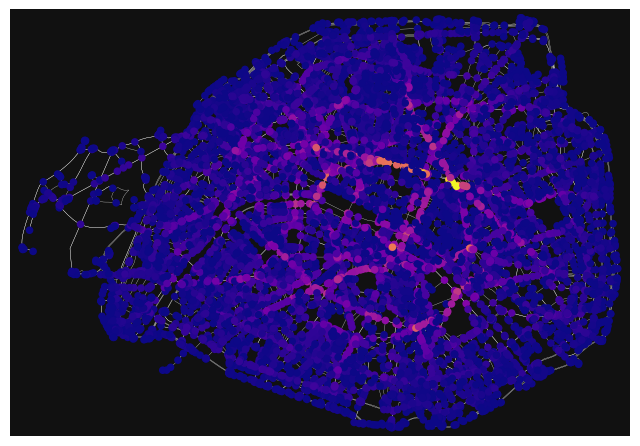

In [17]:
# add the betweenness centrality values as new node attributes, then plot
nx.set_node_attributes(G, bc, "bc")
nc = ox.plot.get_node_colors_by_attr(G, "bc", cmap="plasma")
fig, ax = ox.plot_graph(
    G,
    node_color=nc,
    node_size=30,
    node_zorder=2,
    edge_linewidth=0.2,
    edge_color="w",
)

In [18]:
import osmnx as ox
import networkx as nx
import geopandas as gpd
import matplotlib.pyplot as plt
plt.style.use('default')
import pandas as pd

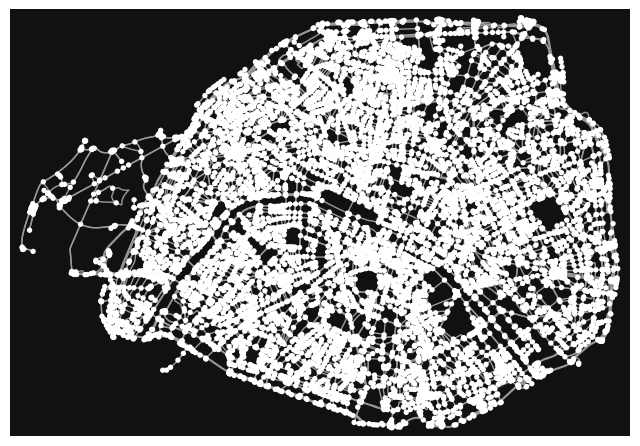

In [19]:
place_name = "Paris, France"
graph = ox.graph_from_place(place_name, network_type='drive')
fig, ax = ox.plot_graph(graph)

In [20]:
edges = ox.graph_to_gdfs(graph, nodes=False, edges=True)


In [21]:
edges.columns


Index(['osmid', 'name', 'highway', 'maxspeed', 'oneway', 'reversed', 'length',
       'lanes', 'geometry', 'junction', 'width', 'bridge', 'tunnel', 'access',
       'ref'],
      dtype='object')

In [22]:
edges.crs


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [23]:
edges.head()


osmid                 name  \
u      v          key                                                
125730 268675130  0                 315818975  Rue Henri Duvernois   
       21112878   0                  31093720    Rue Louis Lumière   
       244455548  0                  85735969    Rue Louis Lumière   
       1089076182 0    [266463585, 611974677]      Rue Louis Ganne   
125742 60912980   0                   4039102      Rue de Buzenval   

                           highway maxspeed  oneway reversed   length lanes  \
u      v          key                                                         
125730 268675130  0    residential       30   False     True    8.707   NaN   
       21112878   0    residential       30   False    False  142.344     2   
       244455548  0    residential       30   False     True  105.925     2   
       1089076182 0    residential       30   False     True  128.653     2   
125742 60912980   0    residential       30    True    False  129.019   NaN   

                                                                geometry  \
u      v          key                                                      
125730 268675130  0      LINESTRING (2.41073 48.86352, 2.41083 48.86348)   
       21112878   0    LINESTRING (2.41073 48.86352, 2.41046 48.86425...   
       244455548  0    LINESTRING (2.41073 48.86352, 2.41077 48.86337...   
       1089076182 0    LINESTRING (2.41073 48.86352, 2.41061 48.86351...   
125742 60912980   0    LINESTRING (2.40137 48.85185, 2.40133 48.85192...   

                      junction width bridge tunnel access  ref  
u      v          key                                           
125730 268675130  0        NaN   NaN    NaN    NaN    NaN  NaN  
       21112878   0        NaN   NaN    NaN    NaN    NaN  NaN  
       244455548  0        NaN   NaN    NaN    NaN    NaN  NaN  
       1089076182 0        NaN   NaN    NaN    NaN    NaN  NaN  
125742 60912980   0        NaN   NaN    NaN    NaN    NaN  NaN

In [24]:
print(edges['highway'].value_counts())


residential                                   8712
primary                                       2949
tertiary                                      2565
secondary                                     2565
unclassified                                   587
living_street                                  492
trunk_link                                     189
trunk                                          146
primary_link                                   126
[living_street, residential]                    58
secondary_link                                  38
[unclassified, residential]                     32
tertiary_link                                   26
motorway_link                                   16
[tertiary, residential]                          8
motorway                                         4
[tertiary, living_street]                        4
[tertiary, primary]                              3
[unclassified, living_street]                    3
[primary, primary_link]        

In [25]:
place = "Culver City, California"
tags = {"building": True}
gdf = ox.geometries_from_place(place, tags={'building':True})
gdf.shape

<ipython-input-25-fbe2c00b6178>:3: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  gdf = ox.geometries_from_place(place, tags={'building':True})


(14662, 134)

In [26]:
fig, ax = ox.plot_geometries(gdf, figsize=(10, 10),bgcolor='#FFFFFF')


AttributeError: ignored

<ipython-input-27-270b00d375bf>:1: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  gdf=ox.geometries.geometries_from_address((52.3716,4.9005),dist=15000,


<Axes: >

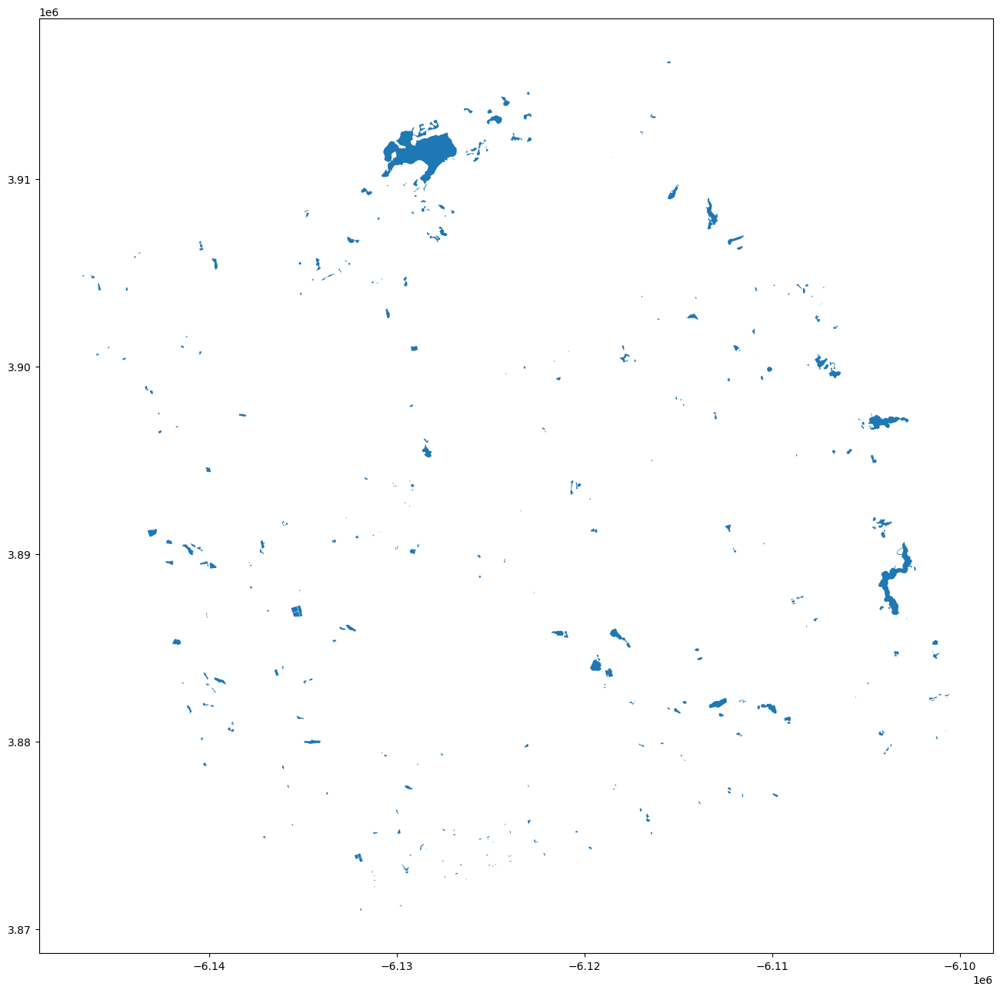

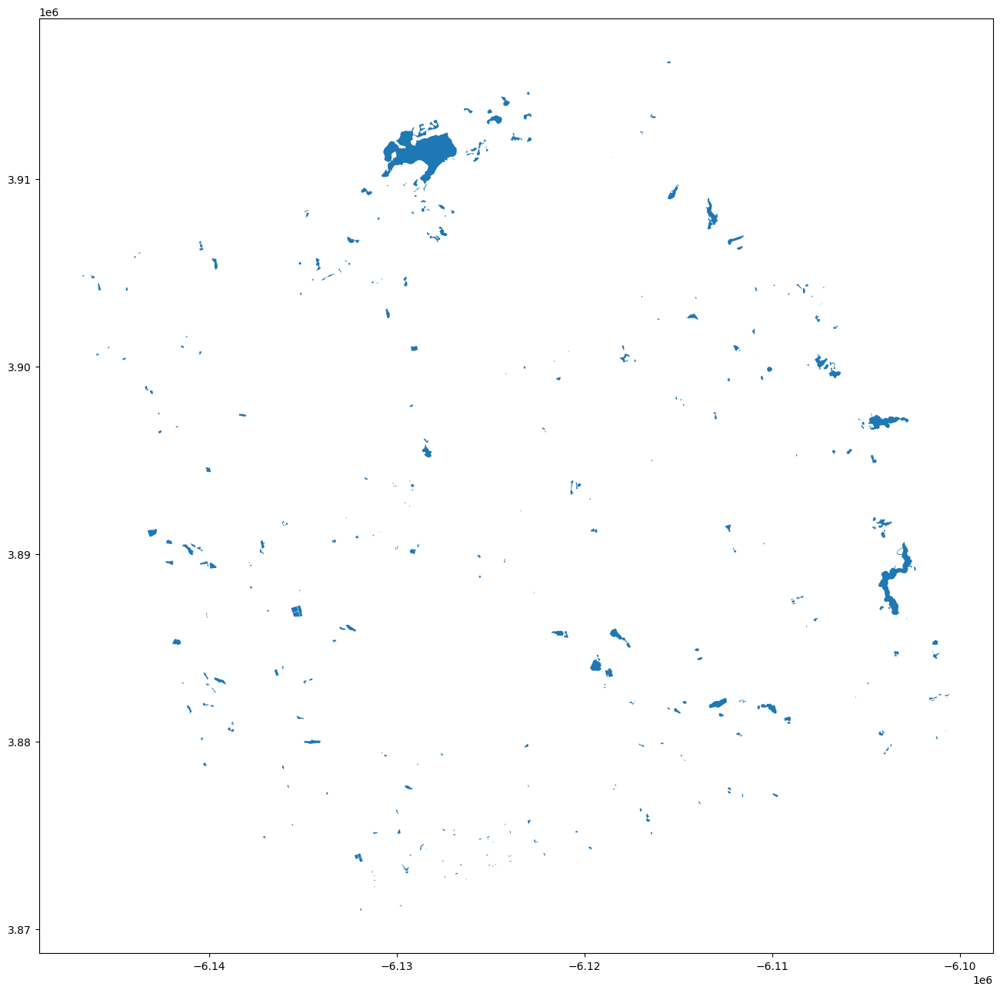

In [27]:
gdf=ox.geometries.geometries_from_address((52.3716,4.9005),dist=15000,
tags={'natural':'water','highway':''})
gdf.to_crs(epsg=28992, inplace=True)
gdf.plot(figsize=(16,16))
gdf.plot(figsize=(16,16))

<ipython-input-28-e9522e2142ce>:1: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  gdf=ox.geometries.geometries_from_address(('Manhattan, NY'),dist=15000,


<Axes: >

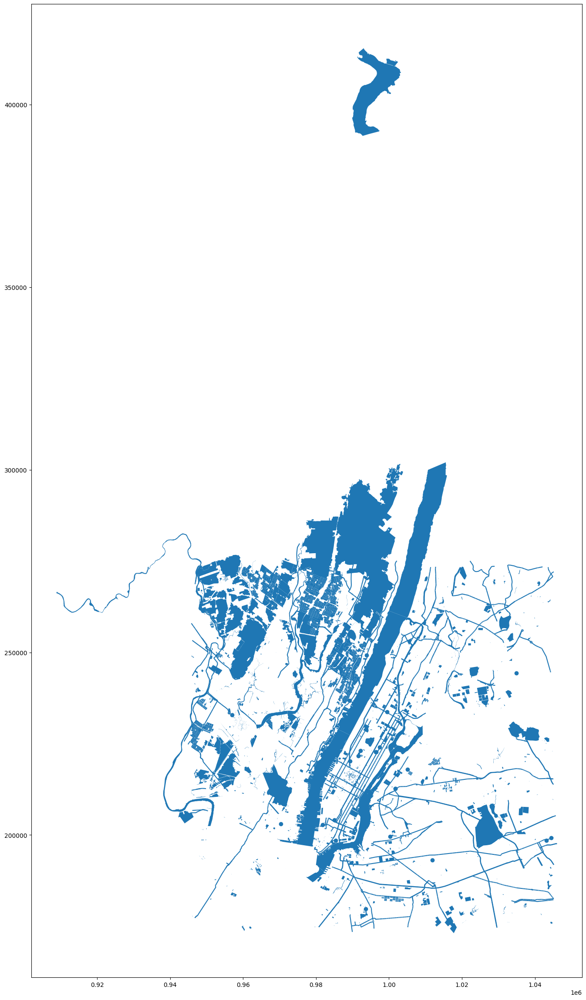

In [28]:
gdf=ox.geometries.geometries_from_address(('Manhattan, NY'),dist=15000,
    tags={'natural':'water','building':'commercial','landuse':'commercial',
    'landuse':'residential','highway':'unclassified','highway':'primary'})
gdf.to_crs(epsg=2263,inplace=True)
gdf.plot(figsize=(20,29))

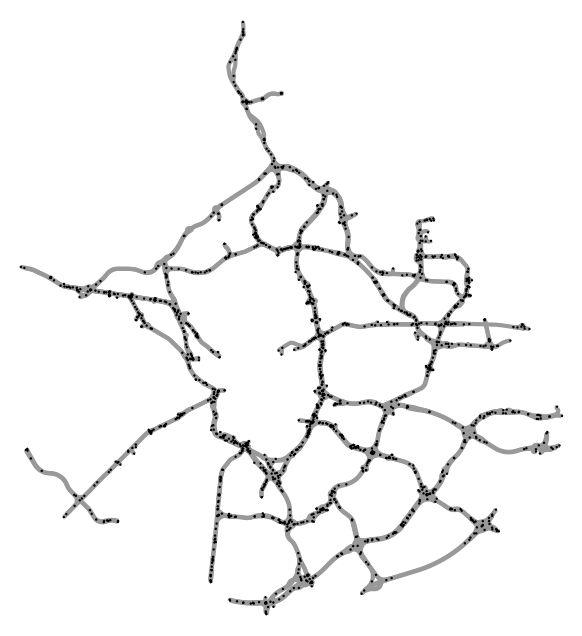

In [29]:
cf = '["highway"~"motorway|motorway_link|trunk|trunk_link"]'
G = ox.graph_from_place("Madrid", network_type="drive", custom_filter=cf)
fig, ax = ox.plot_graph(G, node_size=3,node_color='black',edge_linewidth=3,
bgcolor='#FFFFFF')

<ipython-input-30-23f2542d9164>:3: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  gdf = ox.geometries_from_place(place, tags)


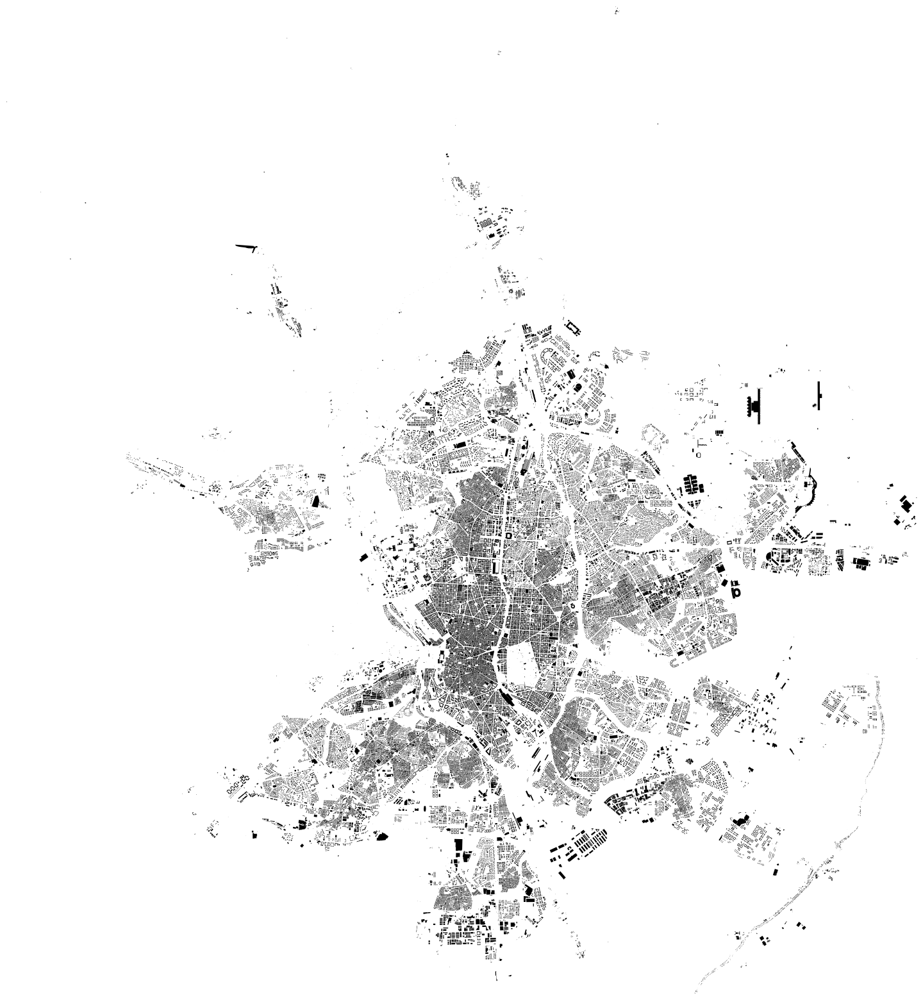

In [30]:
place = "Madrid, Spain"
tags = {"building": True}
gdf = ox.geometries_from_place(place, tags)
fig, ax = ox.plot_footprints(gdf, figsize=(20, 20),alpha=1,color='black',
bgcolor='#FFFFFF',save=True,filepath='settings.imgs_folder/image.png',show=True,
dpi=600)

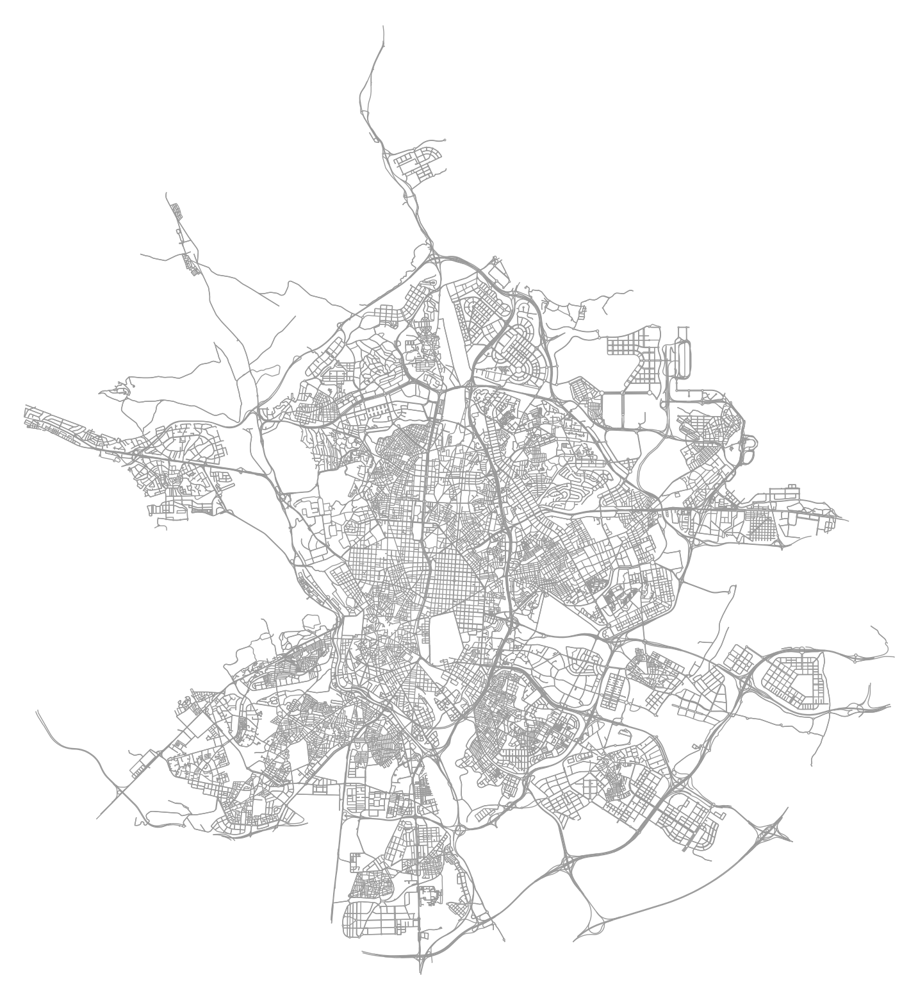

In [31]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline
place_name = 'Madrid,Spain'
G = ox.graph_from_place(place_name,network_type="drive")
fig, ax = ox.plot_graph(G,figsize=(20,20),bgcolor='#FFFFFF',
    node_color='black', node_size=0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


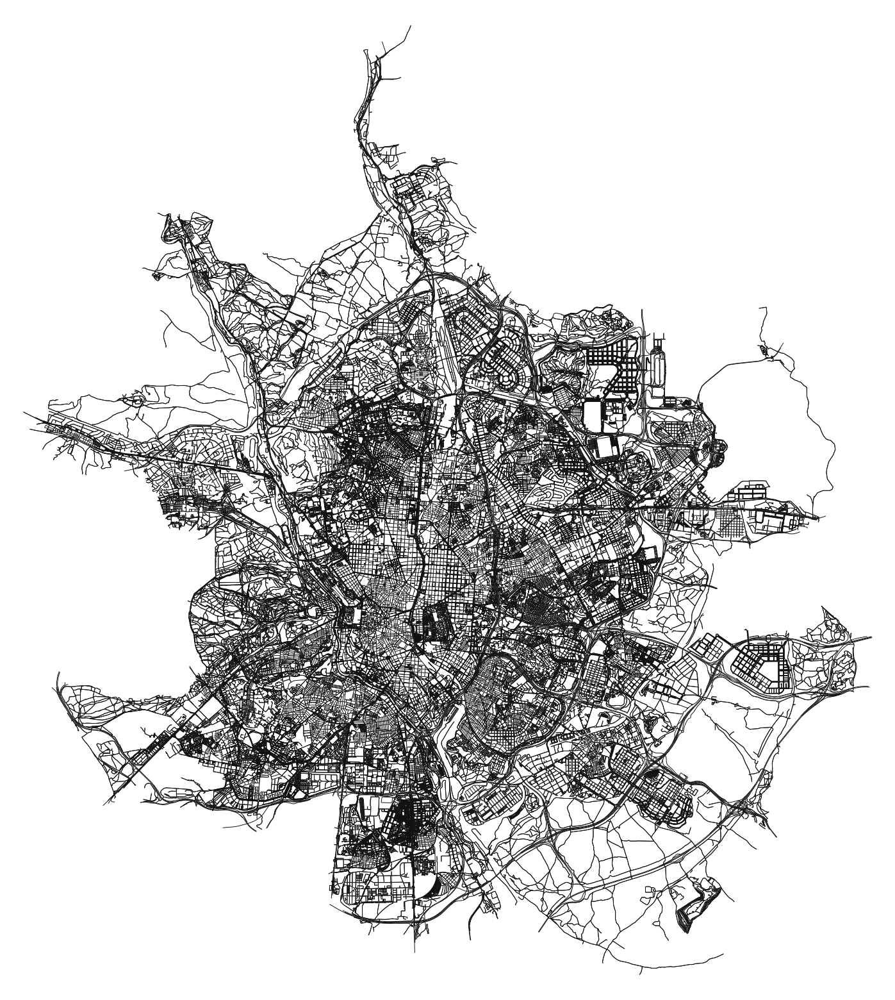

In [32]:
G = ox.graph_from_place(
    "Madrid, Spain",network_type="all",
    retain_all=False,
    truncate_by_edge=True,
    simplify=True,

)

fig, ax = ox.plot_graph(G, figsize=(20, 20),node_size=0, edge_color="#111111",
edge_linewidth=0.7,bgcolor='#FFFFFF')